# Importing libraries needed 

In [1]:
import  numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Loading dataset

In [2]:
df = pd.read_csv("PEP1.csv")

# Visualising some data in dataset

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
# Dropping Id column 
df.drop(['Id'], axis=1,inplace=True)

# Information about the dataset

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

# Identifying the shape of the dataset

In [6]:
df.shape

(1460, 80)

#pd.set_option("display.max_rows",None)

Pandas doesn't print all columns by default. 
If you want to permanently set Pandas print options to display the output of all columns.
you can use any of these options for a TEMPORARY solution:

# Identifying variables with null values and plotting them

In [7]:
null_values = pd.isnull(df).sum()[pd.isnull(df).sum()>0]
null_values

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

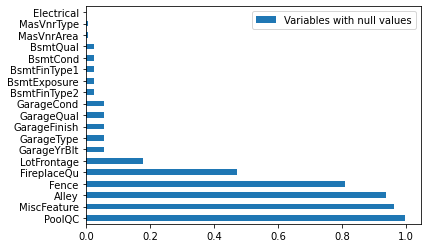

In [8]:
def plot_nas(df: pd.DataFrame):
    if df.isnull().sum().sum() != 0:
        na_df = (df.isnull().sum() / len(df))      
        na_df = na_df.drop(na_df[na_df == 0].index).sort_values(ascending=False)
        missing_data = pd.DataFrame({'Variables with null values' :na_df})
        missing_data.plot(kind = "barh")
        plt.show()
    else:
        print('No NAs found')
plot_nas(df)

# Identifying variables with unique values and plotting them

In [9]:
for col in df:
    print(col, df[col].nunique())

MSSubClass 15
MSZoning 5
LotFrontage 110
LotArea 1073
Street 2
Alley 2
LotShape 4
LandContour 4
Utilities 2
LotConfig 5
LandSlope 3
Neighborhood 25
Condition1 9
Condition2 8
BldgType 5
HouseStyle 8
OverallQual 10
OverallCond 9
YearBuilt 112
YearRemodAdd 61
RoofStyle 6
RoofMatl 8
Exterior1st 15
Exterior2nd 16
MasVnrType 4
MasVnrArea 327
ExterQual 4
ExterCond 5
Foundation 6
BsmtQual 4
BsmtCond 4
BsmtExposure 4
BsmtFinType1 6
BsmtFinSF1 637
BsmtFinType2 6
BsmtFinSF2 144
BsmtUnfSF 780
TotalBsmtSF 721
Heating 6
HeatingQC 5
CentralAir 2
Electrical 5
1stFlrSF 753
2ndFlrSF 417
LowQualFinSF 24
GrLivArea 861
BsmtFullBath 4
BsmtHalfBath 3
FullBath 4
HalfBath 3
BedroomAbvGr 8
KitchebvGr 4
KitchenQual 4
TotRmsAbvGrd 12
Functiol 7
Fireplaces 4
FireplaceQu 5
GarageType 6
GarageYrBlt 97
GarageFinish 3
GarageCars 5
GarageArea 441
GarageQual 5
GarageCond 5
PavedDrive 3
WoodDeckSF 274
OpenPorchSF 202
EnclosedPorch 120
3SsnPorch 20
ScreenPorch 76
PoolArea 8
PoolQC 3
Fence 4
MiscFeature 4
MiscVal 21
MoSold

Generate a separate dataset for numerical and categorical variables

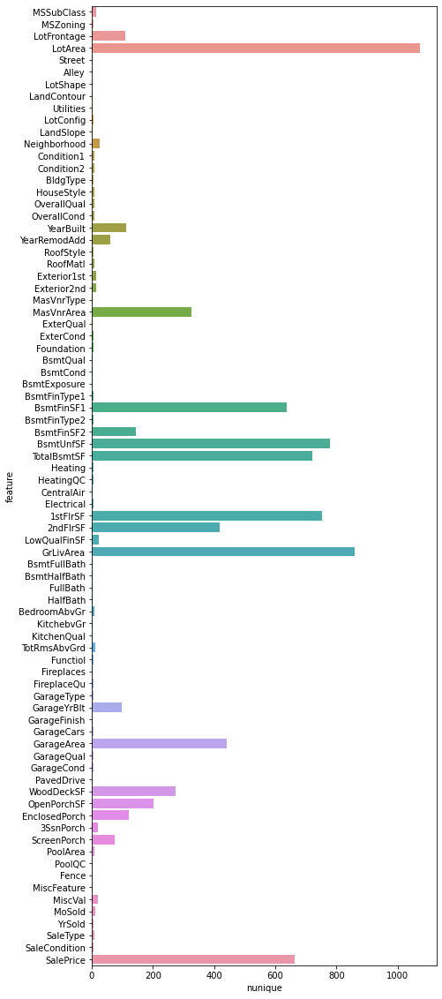

In [10]:
nu = df.nunique().reset_index()
nu.columns = ['feature','nunique']
plt.figure(figsize=(7,20))
ax = sns.barplot(y='feature', x='nunique', data=nu)

# Generating Seprate Dataset ---> (numerical data and categorical data)

In [11]:
numeric_data = df.select_dtypes(include=[np.number])

In [12]:
numeric_data.head(3)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500


In [13]:
# Identifying shape of the dataset
numeric_data.shape

(1460, 37)

In [14]:
categorical_data = df.select_dtypes(exclude=[np.number])

In [15]:
categorical_data.head(3)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


# Dealing with numerical data

# Identifying any missing values in numerical data

In [16]:
pd.isnull(numeric_data).sum()[pd.isnull(numeric_data).sum()>0]

LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64

# Missing value treatment using mean 

In [17]:
numeric_data['LotFrontage'].fillna(numeric_data['LotFrontage'].mean(), inplace = True)
numeric_data['MasVnrArea'].fillna(numeric_data['MasVnrArea'].mean(), inplace = True)
numeric_data['GarageYrBlt'].fillna(numeric_data['GarageYrBlt'].mean(), inplace = True)

In [18]:
# Checking if there is any null value present
pd.isnull(numeric_data).sum().sum()

0

# Identify the skewness and distribution and Poltting it

In [19]:
skew=numeric_data.skew(axis = 0, skipna = True)
print(skew)

MSSubClass        1.407657
LotFrontage       2.384950
LotArea          12.207688
OverallQual       0.216944
OverallCond       0.693067
YearBuilt        -0.613461
YearRemodAdd     -0.503562
MasVnrArea        2.676412
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtFullBath      0.596067
BsmtHalfBath      4.103403
FullBath          0.036562
HalfBath          0.675897
BedroomAbvGr      0.211790
KitchebvGr        4.488397
TotRmsAbvGrd      0.676341
Fireplaces        0.649565
GarageYrBlt      -0.668175
GarageCars       -0.342549
GarageArea        0.179981
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
MoSold            0.212053
YrSold            0.096269
SalePrice         1.882876
d

MSSubClass 1.4076567471495591


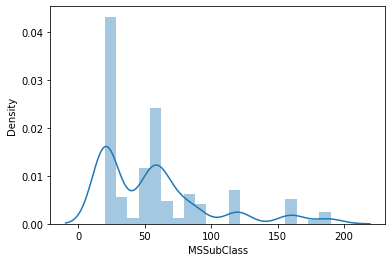

LotFrontage 2.3849501679427925


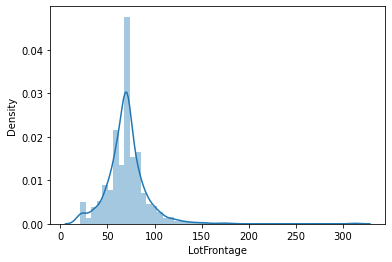

LotArea 12.207687851233496


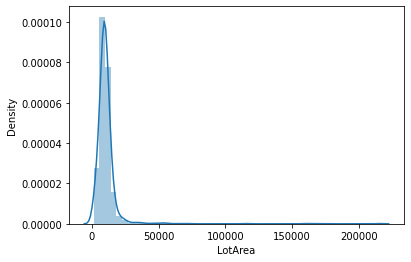

OverallQual 0.2169439277628693


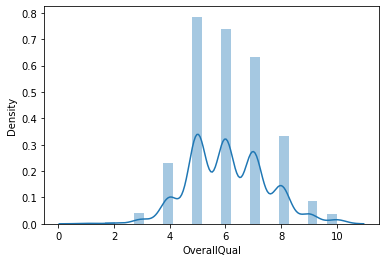

OverallCond 0.6930674724842182


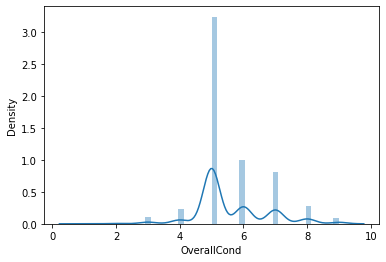

YearBuilt -0.613461172488183


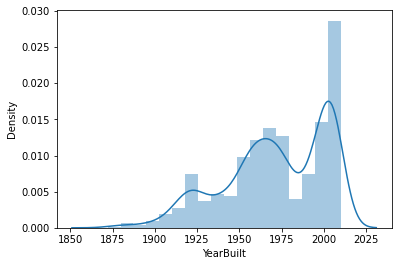

YearRemodAdd -0.5035620027004709


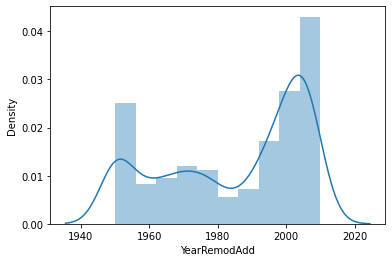

MasVnrArea 2.676411784729959


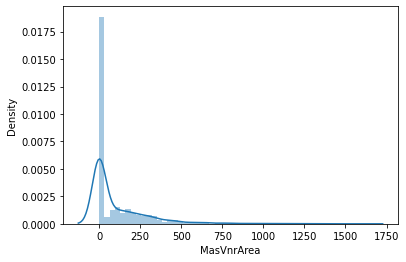

BsmtFinSF1 1.685503071910789


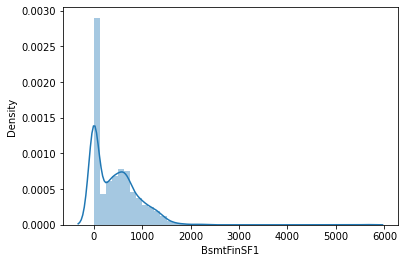

BsmtFinSF2 4.255261108933303


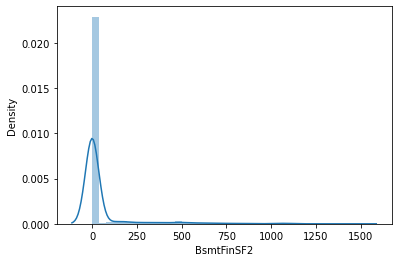

BsmtUnfSF 0.9202684528039037


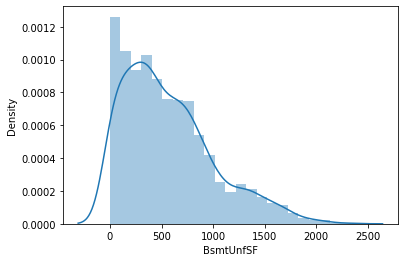

TotalBsmtSF 1.5242545490627664


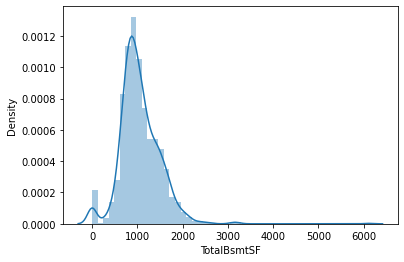

1stFlrSF 1.3767566220336365


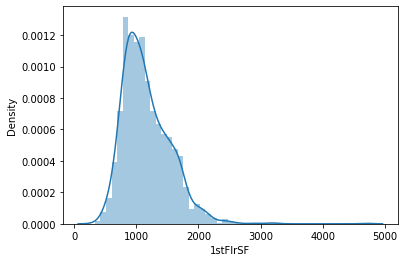

2ndFlrSF 0.8130298163023265


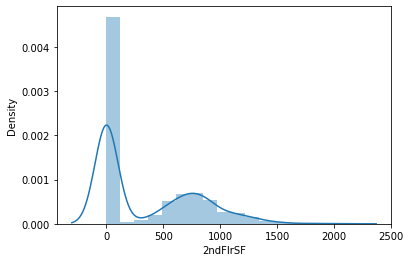

LowQualFinSF 9.011341288465387


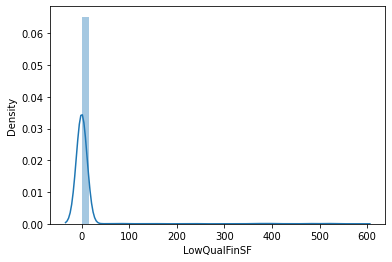

GrLivArea 1.3665603560164552


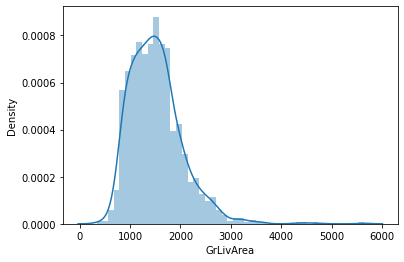

BsmtFullBath 0.596066609663168


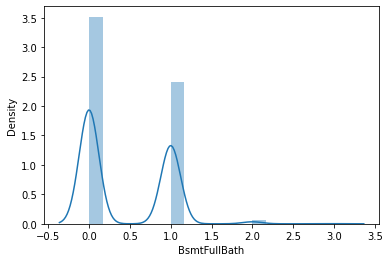

BsmtHalfBath 4.103402697955168


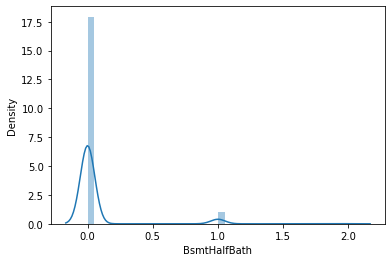

FullBath 0.036561558402727165


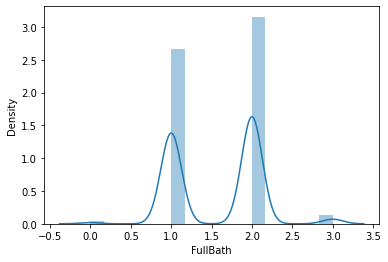

HalfBath 0.675897448233722


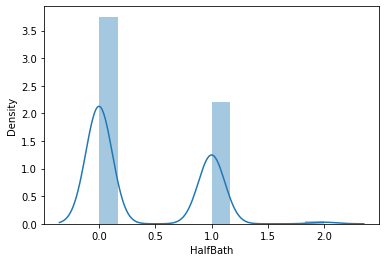

BedroomAbvGr 0.21179009627507137


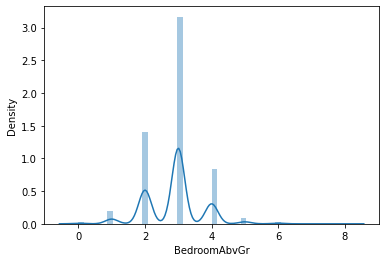

KitchebvGr 4.488396777072859


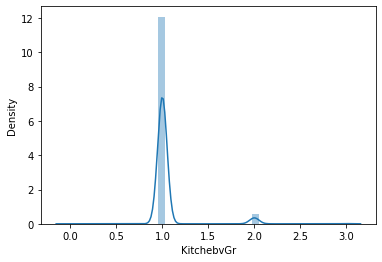

TotRmsAbvGrd 0.6763408364355531


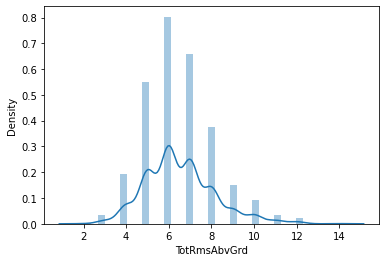

Fireplaces 0.6495651830548841


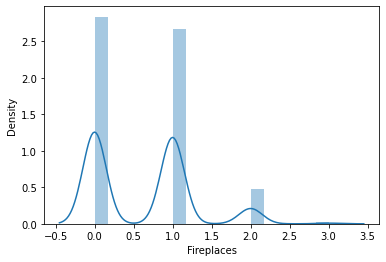

GarageYrBlt -0.6681748227563908


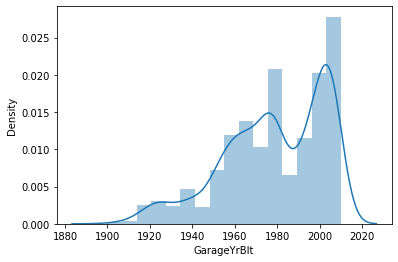

GarageCars -0.3425489297486655


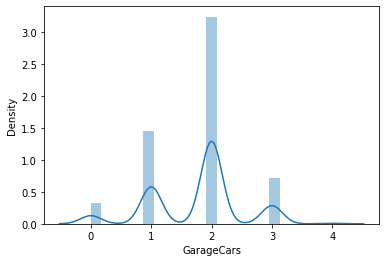

GarageArea 0.17998090674623907


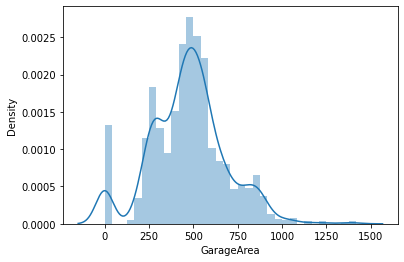

WoodDeckSF 1.5413757571931312


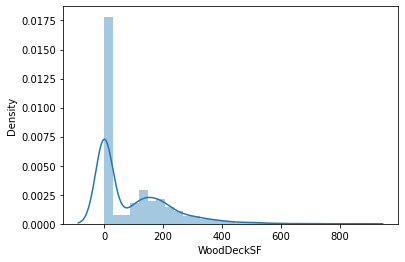

OpenPorchSF 2.3643417403694404


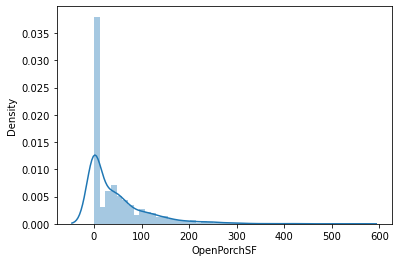

EnclosedPorch 3.08987190371177


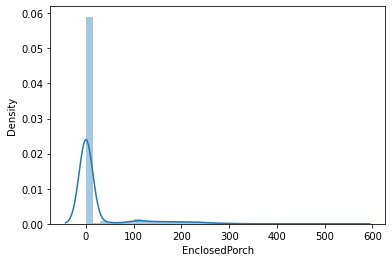

3SsnPorch 10.304342032693112


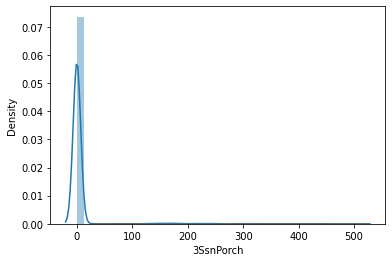

ScreenPorch 4.122213743143115


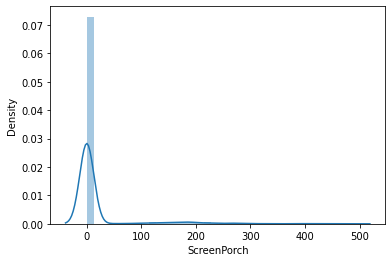

PoolArea 14.828373640750588


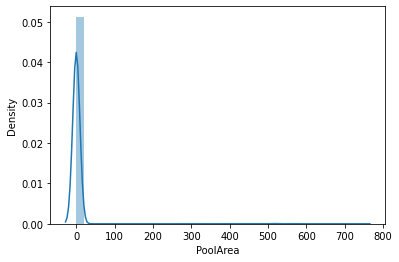

MiscVal 24.476794188821916


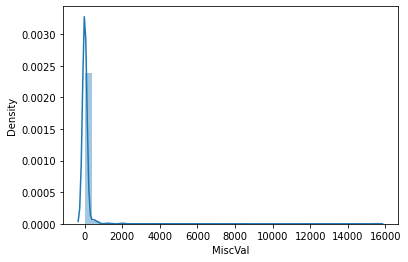

MoSold 0.21205298505146022


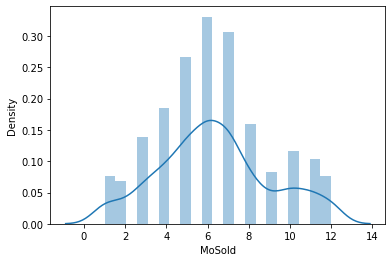

YrSold 0.09626851386568028


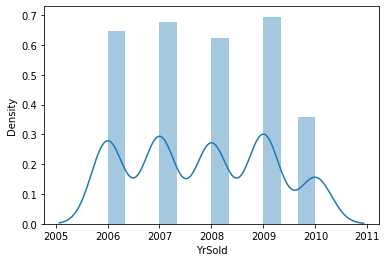

SalePrice 1.8828757597682129


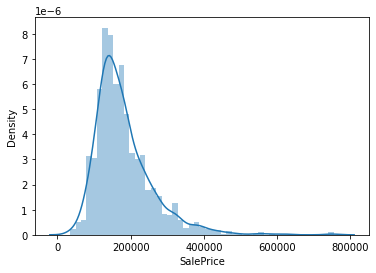

In [20]:
for col in numeric_data:
    print(col,skew[col])
    plt.figure()
    sns.distplot(numeric_data[col])
    plt.show()

# Identifying significant variables using a correlation matrix 

In [21]:
corr = numeric_data.corr()
corr.style.background_gradient(cmap='twilight_shifted').set_precision(2)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchebvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.00,-0.36,-0.14,0.03,-0.06,0.03,0.04,0.02,-0.07,-0.07,-0.14,-0.24,-0.25,0.31,0.05,0.07,0.00,-0.00,0.13,0.18,-0.02,0.28,0.04,-0.05,0.08,-0.04,-0.10,-0.01,-0.01,-0.01,-0.04,-0.03,0.01,-0.01,-0.01,-0.02,-0.08
LotFrontage,-0.36,1.00,0.31,0.23,-0.05,0.12,0.08,0.18,0.22,0.04,0.12,0.36,0.41,0.07,0.04,0.37,0.09,-0.01,0.18,0.05,0.24,-0.01,0.32,0.24,0.06,0.27,0.32,0.08,0.14,0.01,0.06,0.04,0.18,0.00,0.01,0.01,0.33
LotArea,-0.14,0.31,1.00,0.11,-0.01,0.01,0.01,0.10,0.21,0.11,-0.00,0.26,0.30,0.05,0.00,0.26,0.16,0.05,0.13,0.01,0.12,-0.02,0.19,0.27,-0.02,0.15,0.18,0.17,0.08,-0.02,0.02,0.04,0.08,0.04,0.00,-0.01,0.26
OverallQual,0.03,0.23,0.11,1.00,-0.09,0.57,0.55,0.41,0.24,-0.06,0.31,0.54,0.48,0.30,-0.03,0.59,0.11,-0.04,0.55,0.27,0.10,-0.18,0.43,0.40,0.52,0.60,0.56,0.24,0.31,-0.11,0.03,0.06,0.07,-0.03,0.07,-0.03,0.79
OverallCond,-0.06,-0.05,-0.01,-0.09,1.00,-0.38,0.07,-0.13,-0.05,0.04,-0.14,-0.17,-0.14,0.03,0.03,-0.08,-0.05,0.12,-0.19,-0.06,0.01,-0.09,-0.06,-0.02,-0.31,-0.19,-0.15,-0.00,-0.03,0.07,0.03,0.05,-0.00,0.07,-0.00,0.04,-0.08
YearBuilt,0.03,0.12,0.01,0.57,-0.38,1.00,0.59,0.31,0.25,-0.05,0.15,0.39,0.28,0.01,-0.18,0.20,0.19,-0.04,0.47,0.24,-0.07,-0.17,0.10,0.15,0.78,0.54,0.48,0.22,0.19,-0.39,0.03,-0.05,0.00,-0.03,0.01,-0.01,0.52
YearRemodAdd,0.04,0.08,0.01,0.55,0.07,0.59,1.00,0.18,0.13,-0.07,0.18,0.29,0.24,0.14,-0.06,0.29,0.12,-0.01,0.44,0.18,-0.04,-0.15,0.19,0.11,0.62,0.42,0.37,0.21,0.23,-0.19,0.05,-0.04,0.01,-0.01,0.02,0.04,0.51
MasVnrArea,0.02,0.18,0.10,0.41,-0.13,0.31,0.18,1.00,0.26,-0.07,0.11,0.36,0.34,0.17,-0.07,0.39,0.09,0.03,0.28,0.20,0.10,-0.04,0.28,0.25,0.25,0.36,0.37,0.16,0.12,-0.11,0.02,0.06,0.01,-0.03,-0.01,-0.01,0.48
BsmtFinSF1,-0.07,0.22,0.21,0.24,-0.05,0.25,0.13,0.26,1.00,-0.05,-0.50,0.52,0.45,-0.14,-0.06,0.21,0.65,0.07,0.06,0.00,-0.11,-0.08,0.04,0.26,0.15,0.22,0.30,0.20,0.11,-0.10,0.03,0.06,0.14,0.00,-0.02,0.01,0.39
BsmtFinSF2,-0.07,0.04,0.11,-0.06,0.04,-0.05,-0.07,-0.07,-0.05,1.00,-0.21,0.10,0.10,-0.10,0.01,-0.01,0.16,0.07,-0.08,-0.03,-0.02,-0.04,-0.04,0.05,-0.09,-0.04,-0.02,0.07,0.00,0.04,-0.03,0.09,0.04,0.00,-0.02,0.03,-0.01


In [22]:
# Identifying significant variables using a correlation matrix----> seaborn
# plt.figure(figsize=(25,25))
# sns.heatmap(numeric_data.corr(),annot=True,cmap='Blues')

# Plotting Pair Plot for numerical data

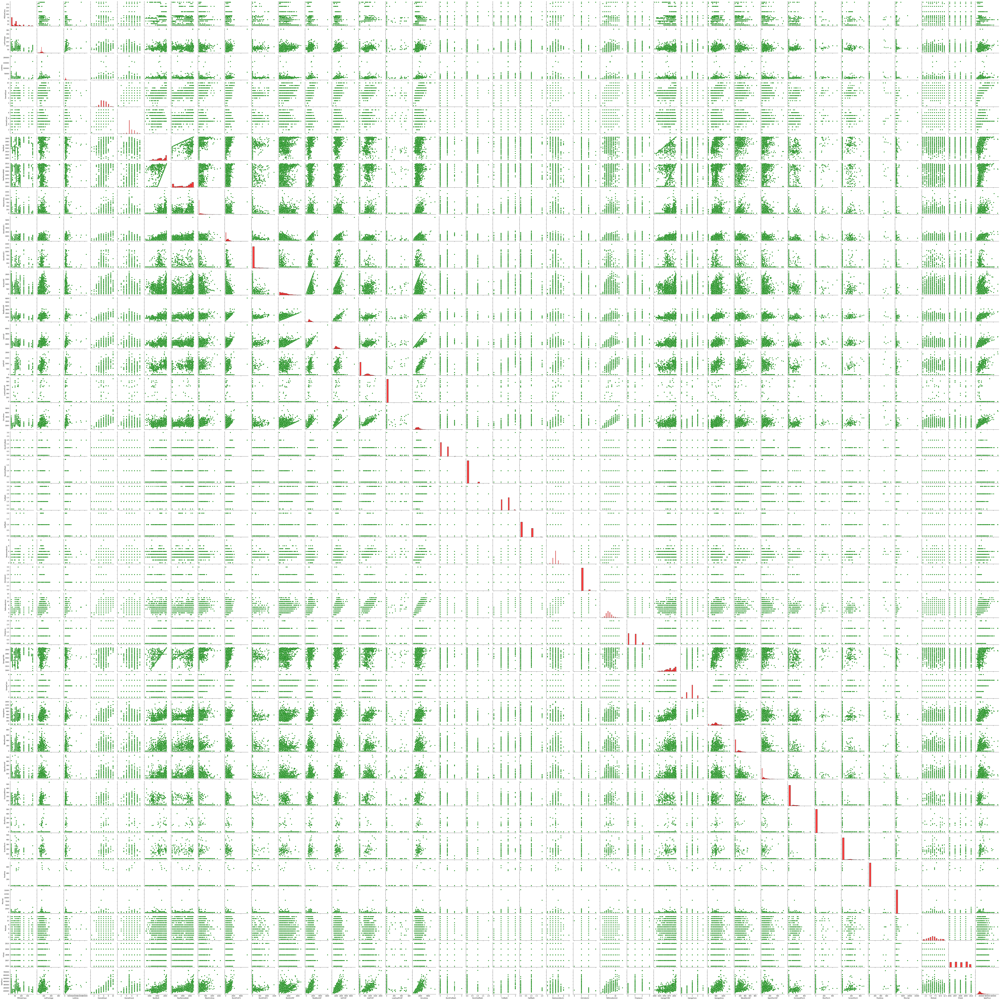

In [23]:
sns.pairplot(numeric_data,diag_kws={'color':'red'}, 
            plot_kws={'color':'green'})
plt.show()

In [24]:
# for i in numeric_data.columns:
#     sns.boxplot(numeric_data[i],color='Green')
#     plt.show()

In [25]:

# for i in numeric_data.columns:
    
#     q1=numeric_data[i].quantile(0.25)

#     q3=numeric_data[i].quantile(0.75)

#     iqr=q3-q1

#     UB= q3+1.5*iqr

#     LB =q1-1.5*iqr
    
#     numeric_data[i]=np.where(numeric_data[i]>UB, UB, numeric_data[i])

#     numeric_data[i]=np.where(numeric_data[i]<LB, LB, numeric_data[i])
    

# Dealing with categorical data

In [26]:
categorical_data.head(3)

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


# Identifying null values in categorical data

In [27]:
pd.isnull(categorical_data).sum()[pd.isnull(categorical_data).sum()>0]

Alley           1369
MasVnrType         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

# Obtaining values/variables which have nulls more than 60% and dropping them

In [28]:
# Below code gives percentage of null in every column
null_percentage = categorical_data.isnull().sum()/numeric_data.shape[0]*100

# Below code gives list of columns having more than 60% null
col_to_drop = null_percentage[null_percentage>60].keys()

output_df = categorical_data.drop(col_to_drop, axis=1)

# Missing value treatment for categorical data (Mean)

In [29]:
from sklearn.impute import SimpleImputer
value = output_df.values
 
# defining the imputer
imputer = SimpleImputer(missing_values=np.nan ,strategy='most_frequent')
#for col in cdata:
transformed_values_cate_data = imputer.fit_transform(value)

In [30]:
type(transformed_values_cate_data)

numpy.ndarray

# Converting the ndarray(transformed_values_cate_data)  to dataframe

In [31]:
transformed_values_cate_data=pd.DataFrame(transformed_values_cate_data)
transformed_values_cate_data

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
1456,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,...,TA,Min1,TA,Attchd,Unf,TA,TA,Y,WD,Normal
1457,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1458,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,mes,Norm,Norm,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal


In [32]:
pd.isnull(transformed_values_cate_data).sum().sum()
# pd.isnull(transformed_values_cate_data).sum()[pd.isnull(transformed_values_cate_data).sum()>0]

0

In [33]:
# col_add=output_df.columns
# col_add

# Adding columns/variables to above dataframe

In [34]:
transformed_values_cate_data.columns=output_df.columns

In [35]:
# Viewing datast
transformed_values_cate_data.head(3)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functiol,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


# Plotting Count plot 

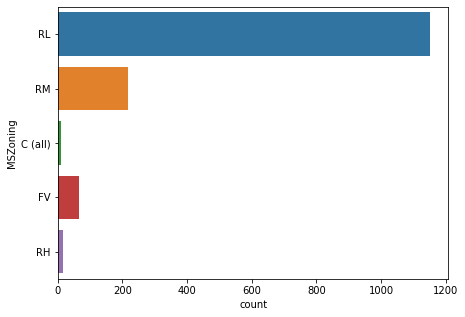

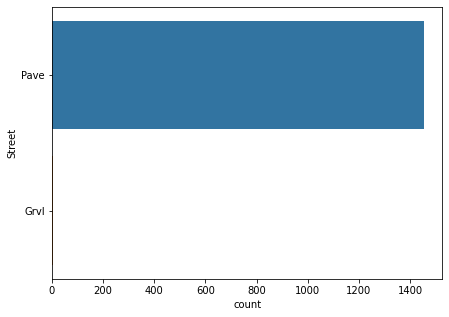

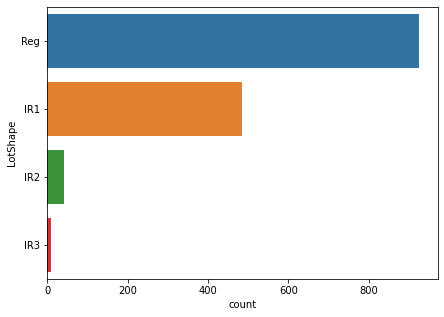

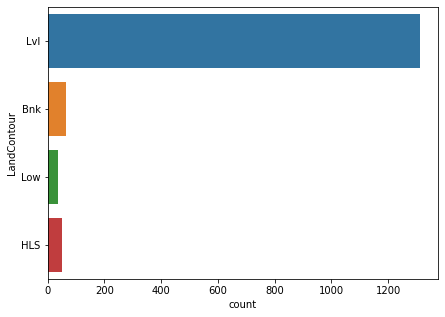

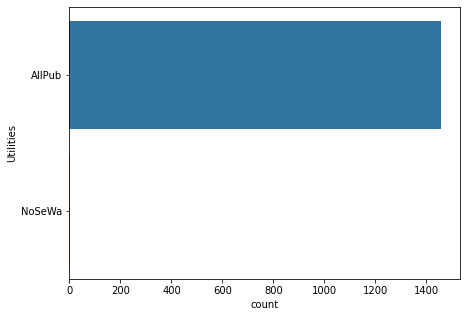

...

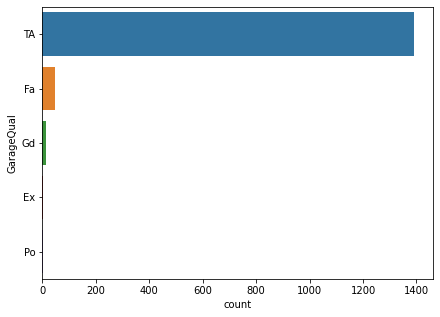

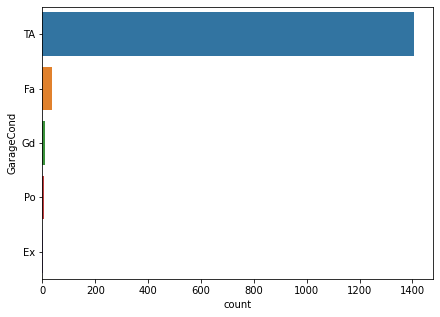

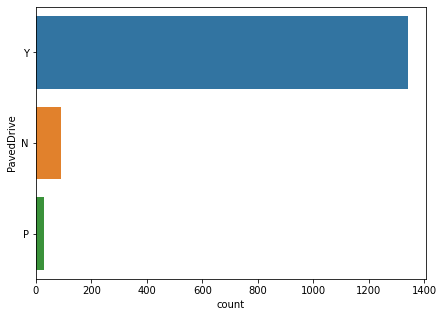

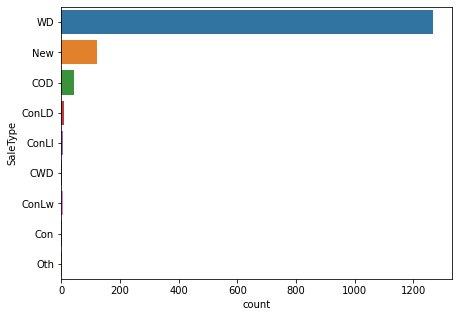

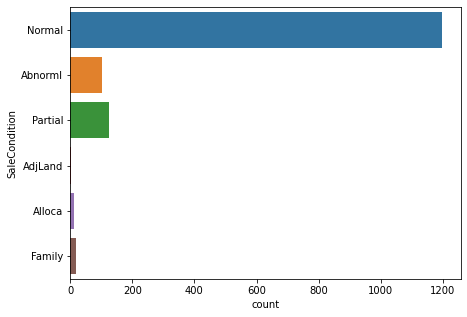

In [36]:
 for col in transformed_values_cate_data:
     plt.figure(figsize=(7,5))
     sns.countplot(y=transformed_values_cate_data[col])
     plt.show()

# Plotting box plot

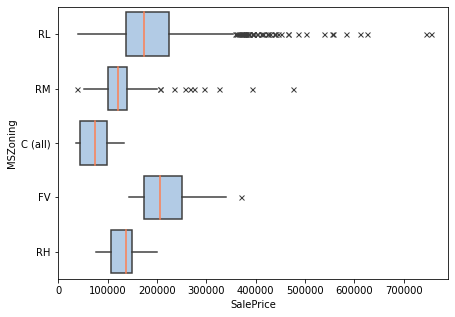

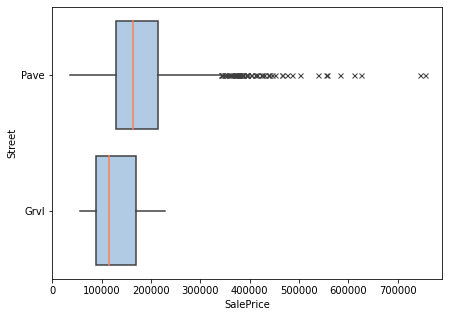

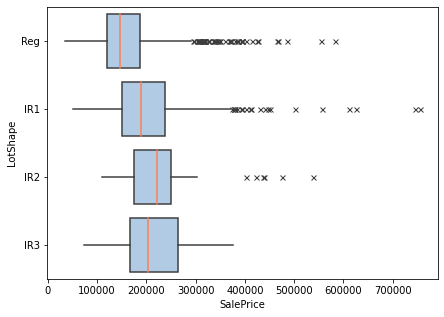

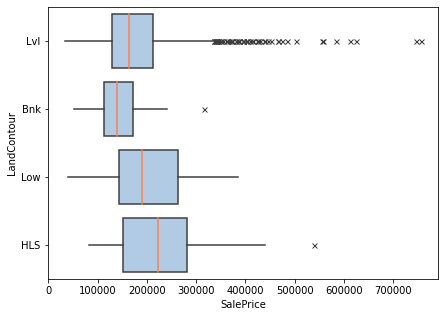

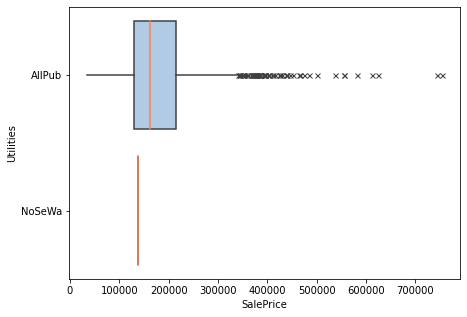

...

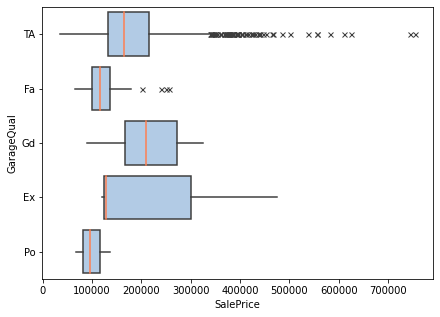

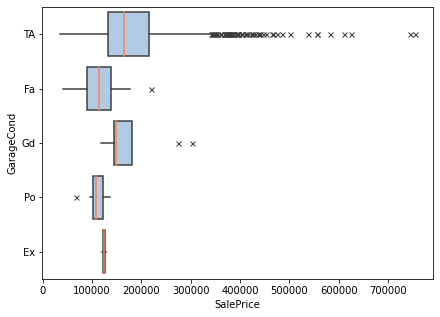

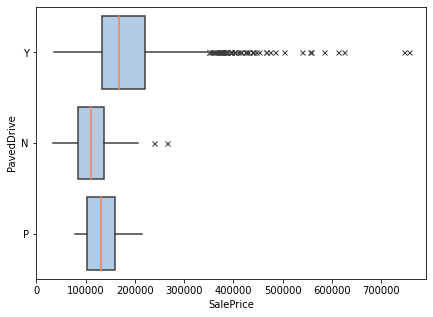

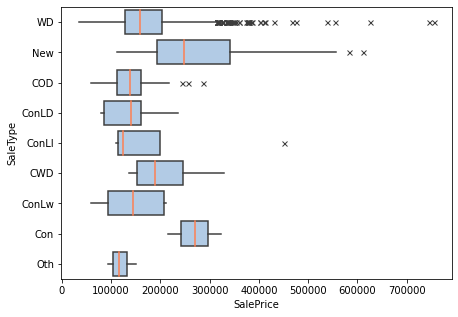

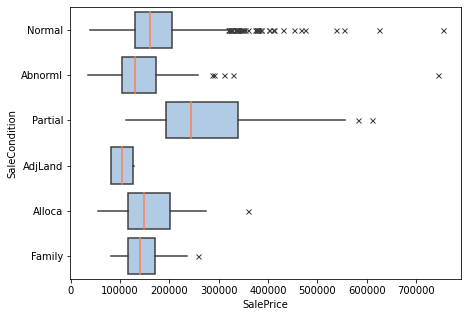

In [37]:
Y = numeric_data['SalePrice']
for col in transformed_values_cate_data:
     plt.figure(figsize=(7,5))
     sns.boxplot(x=Y,y=transformed_values_cate_data[col],showcaps=False,
     flierprops={"marker": "x"},    
     boxprops={"facecolor": (.4, .6, .8, .5)},
     medianprops={"color": "coral"})
     plt.show()

In [38]:
# 

In [49]:
from scipy import stats
for i in transformed_values_cate_data.columns:
    x=pd.crosstab(transformed_values_cate_data[i],df.SalePrice)
    coeff,pval,dof,exp=stats.chi2_contingency(x.values)
    if pval<0.05:
        print('H1--Alternate------>Relation exists')
    else:
        print('H0--Null Hypothsis---- No Relation')
        # transformed_values_cate_data.drop(i,axis=1,inplace=True)

H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists
H1--Alternate------>Relation exists


# Combining DataSets----> (numerical dataset and categorical dataset)

In [ ]:
numeric_data.info()

In [ ]:
transformed_values_cate_data.info()

In [51]:
# fulldata_set=pd.concat([ndata,aa,data['SalePrice']],axis=1)
result_dataset = pd.concat([numeric_data, transformed_values_cate_data], axis=1)
result_dataset.head(3)

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,BsmtQual,BsmtCond,BsmtExposure,Heating,CentralAir,KitchenQual,FireplaceQu,GarageFinish,SaleType,SaleCondition
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,Gd,TA,No,GasA,Y,Gd,Gd,RFn,WD,Normal
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,Gd,TA,Gd,GasA,Y,TA,TA,RFn,WD,Normal
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,Gd,TA,Mn,GasA,Y,Gd,TA,RFn,WD,Normal


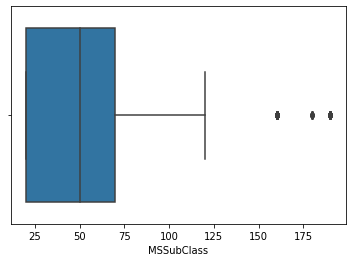

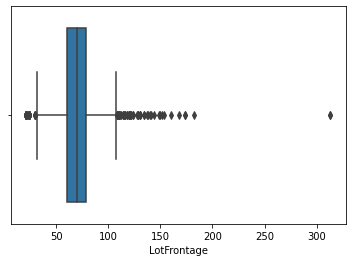

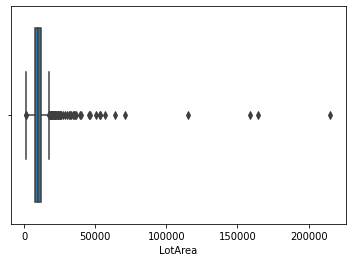

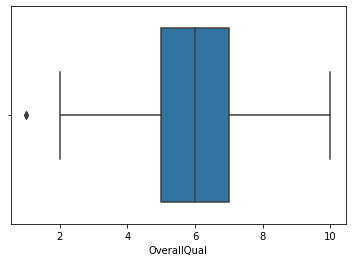

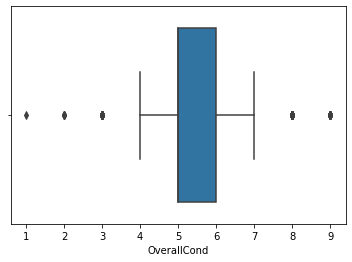

...

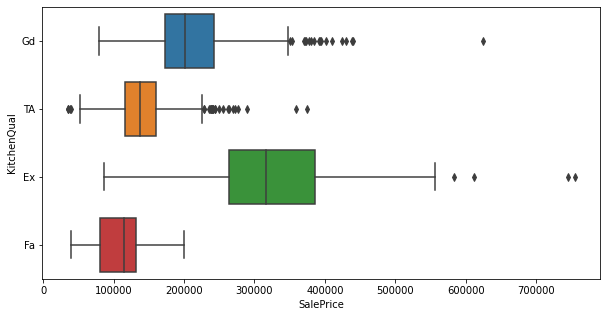

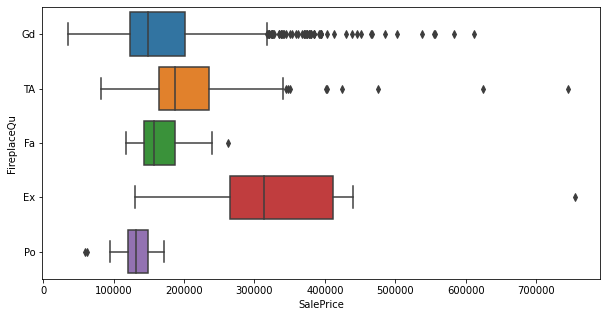

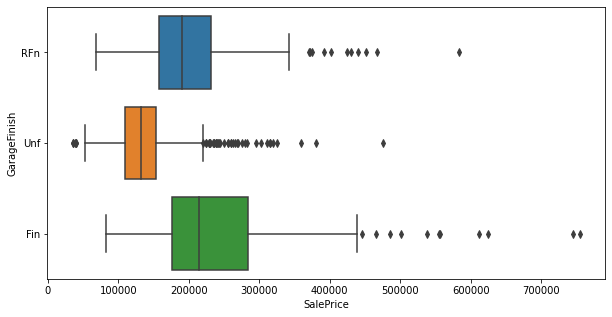

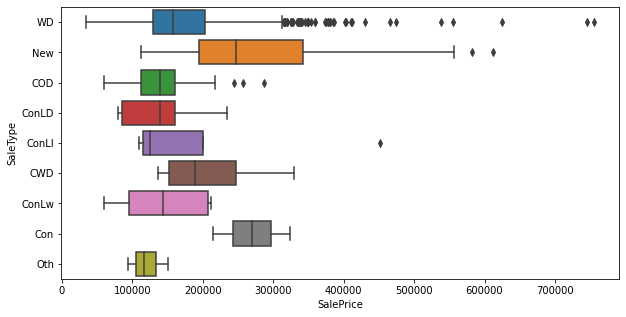

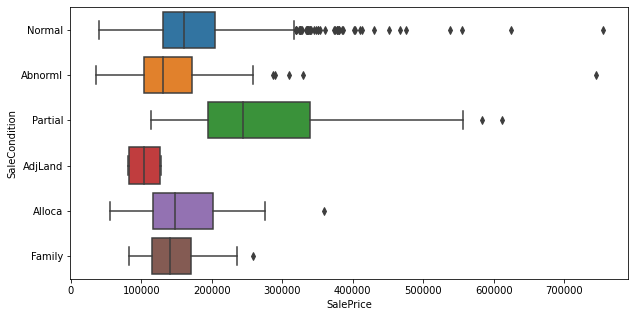

In [54]:
for i in result_dataset.columns:
    if result_dataset[i].dtypes=='int64' or result_dataset[i].dtypes=='float64':
        sns.boxplot(result_dataset[i])
        plt.show()
    else:
        plt.figure(figsize=(10,5))
        sns.boxplot(x=result_dataset['SalePrice'],y=result_dataset[i])
        plt.show()